In [2]:
##Import modules etc.
import skimage.io as io
io.use_plugin('tifffile')
import glob
import os
import time
import pandas as pd
import numpy as np
import itertools
import mahotas as mh
from mahotas.labeled import filter_labeled
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from skimage.measure import regionprops
from skimage.morphology import watershed
from skimage.feature import peak_local_max
from skimage.morphology import remove_small_objects

from scipy import ndimage
from scipy.ndimage import morphology
from skimage.draw import polygon_perimeter ##Not used

from skimage.measure import find_contours

In [3]:
#Import files
#Get targeted filelist
path='C:/Users/David Brown/Documents/Huang Lab/Exp0104_KDM5A_PHD2-fragments/'

target='.ome.tif'

filelist=glob.glob(path+str('*')+target)

#Get shell list
shell_list=glob.glob(path+str('/Output/Shells/*Shells.npy'))

In [4]:
#load Hoechst and GFP stacks from .ome.tif files
def load_ome(ome_stack_file):

    #MMStack .ome.tif files load channel,z,y,x
    #Check file contains .ome.tif
    if '.ome.tif' in ome_stack_file:

        #Load the file
        im=io.imread(ome_stack_file)

        #Select Hoechst stack
        Hoechst_stack = im[0,:,:,:] #Hoechst Channel = 0
        GFP_stack = im[1,:,:,:]     #GFP Channel = 1
        
        #
        return [Hoechst_stack, GFP_stack]
        #return GFP_stack
        
    else:
        print 'this is not an ome.tif'

In [5]:
#Load tif files
[Hoechst_stack, GFP_stack] = load_ome(filelist[2])

In [6]:
shell_list[4]

'C:/Users/David Brown/Documents/Huang Lab/Exp0104_KDM5A_PHD2-fragments//Output/Shells\\Well02_HeLa_PHD2-IDR-PHD3_3_Shells.npy'

In [7]:
#Load shells
mask6 = np.load(shell_list[4])

(<matplotlib.axes._subplots.AxesSubplot at 0xd3a2198>,
 <matplotlib.text.Text at 0xe6ca278>)

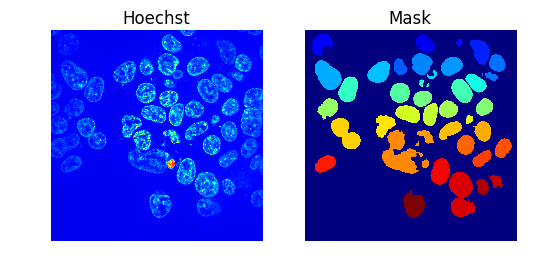

In [8]:
##Compare
plt.subplot(1,2,1), plt.imshow(Hoechst_stack[12])
plt.subplot(1,2,1), plt.axis('off')
plt.subplot(1,2,1), plt.title('Hoechst')
plt.subplot(1,2,2), plt.imshow(mask6[12])
plt.subplot(1,2,2), plt.axis('off')
plt.subplot(1,2,2), plt.title('Mask')

In [9]:
#Convert mask to polygons (not the best way to do this in the end, might be usefull on mask5)
#rr, cc = polygon_perimeter(poly[:, 0], poly[:, 1])

In [10]:
##Get a list 'altlines' of the [x,y] coordinates for each region
altlines = find_contours(mask6[4], 0.8)

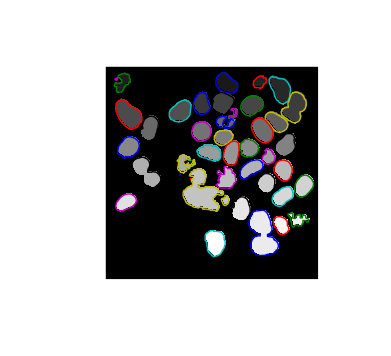

In [11]:
#Plot as an overlay
fig, ax = plt.subplots()
ax.imshow(mask6[4], interpolation='nearest', cmap=plt.cm.gray)
ax.axis('off')

for n, altline in enumerate(altlines):
    ax.plot(altline[:, 1], altline[:, 0], linewidth=1)

C:\Users\David Brown\Anaconda2\lib\site-packages\matplotlib\cbook.py:137: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


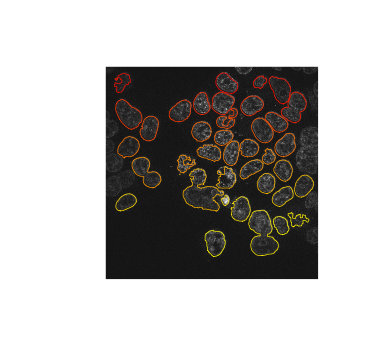

In [12]:
#Overlay over original image
fig, ax = plt.subplots()
ax.imshow(Hoechst_stack[4], interpolation='nearest', cmap=plt.cm.gray)
ax.axis('off')

ax.set_color_cycle(sns.color_palette("autumn", len(altlines)))
for n, altline in enumerate(altlines):
    ax.plot(altline[:, 1], altline[:, 0], linewidth=0.5)

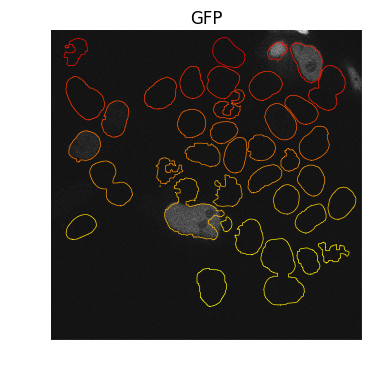

In [14]:
#Overlay over original image
plt.imshow(GFP_stack[4], interpolation='nearest', cmap=plt.cm.gray)
plt.axis('off')
ax=plt.gca()

ax.set_color_cycle(sns.color_palette("autumn", len(altlines)))
for n, altline in enumerate(altlines):
    ax.plot(altline[:, 1], altline[:, 0], linewidth=0.5)
    ax.set_xlim(0,2048)
    ax.set_ylim(2048,0) #Note axis inversion
    
plt.title('GFP')

In [121]:
#Operate on z-stack
def stackOutlines(stack):
    
    outline_stack=[]

    #iterate through z-slices
    for z, frame in enumerate(stack):

        outlines=[]

        #iterate through objects
        for l in range(frame.max()):
            ll=l+1
            outlines.append(find_contours(frame==ll, 0.8))

        outline_stack.append(outlines)        
                
    return outline_stack

In [141]:
##Find outlines for each object
outline_stack = stackOutlines(mask6)

In [125]:
#Flatten a single z-slice
flattened_list  = list(itertools.chain(*outline_stack[z]))

In [149]:
z=5

NameError: name 'z' is not defined

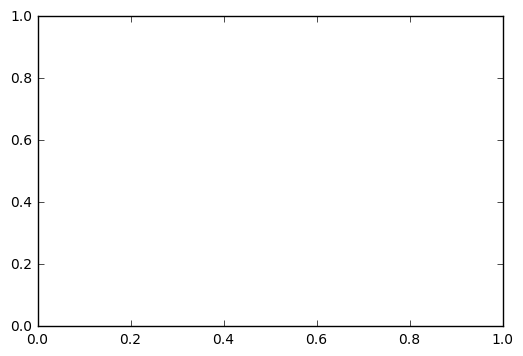

In [15]:
##Overlay Contours
fig, ax = plt.subplots()
ax.imshow(Hoechst_stack[z], interpolation='nearest', cmap=plt.cm.gray)
ax.axis('off')

ax.set_color_cycle(sns.color_palette("Set2", len(outline_stack[z])))

#Flatten a single z-slice
flattened_list  = list(itertools.chain(*outline_stack[z]))

#Plot contours
for n, line in enumerate(flattened_list):
    ax.plot(line[:, 1], line[:, 0], linewidth=0.5)
    ax.set_xlim(0,2048)
    ax.set_ylim(2048,0)
    
plt.title('Hoechst')

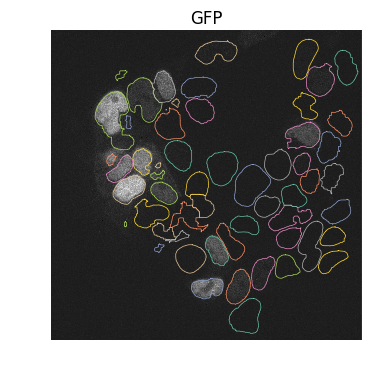

In [160]:
##Overlay Contours
fig, ax = plt.subplots()
ax.imshow(GFP_stack[z], interpolation='nearest', cmap=plt.cm.gray)
ax.axis('off')

ax.set_color_cycle(sns.color_palette("Set2", len(outline_stack[z])))

#Flatten a single z-slice
flattened_list  = list(itertools.chain(*outline_stack[z]))

#Plot contours
for n, line in enumerate(flattened_list):
    ax.plot(line[:, 1], line[:, 0], linewidth=0.5)
    ax.set_xlim(0,2048)
    ax.set_ylim(0,2048)
    
plt.title('GFP')

In [153]:
##Colours are not consistent across z-slices

In [161]:
len(GFP_stack)

24

In [162]:
numrows = len(GFP_stack[1]) 

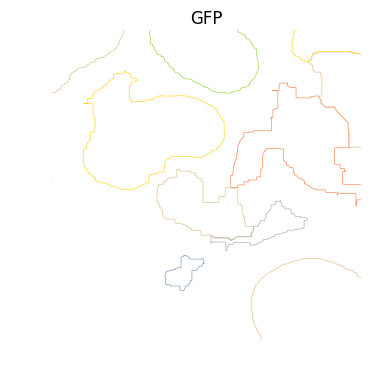

In [155]:
##What happens if you crop?
#It doesn't work

In [172]:
#Generate the overlay image stack
def overlayFig(intensity_stack, outline_stack, z):

    ##Overlay Contours
    fig, ax = plt.subplots()
    ax.imshow(intensity_stack[z], interpolation='nearest', cmap=plt.cm.gray)
    ax.axis('off')

    ax.set_color_cycle(sns.color_palette("Set2", len(outline_stack[z])))

    #Flatten a single z-slice
    flattened_list  = list(itertools.chain(*outline_stack[z]))

    #Plot contours
    for n, line in enumerate(flattened_list):
        ax.plot(line[:, 1], line[:, 0], linewidth=0.5)

        #Set limits based on instensity stack shape
        ax.set_xlim(0,len(intensity_stack[1]))
        ax.set_ylim(0,len(intensity_stack[2]))
    
    return fig

In [177]:
#operate on every z-slice and save as a list
def overlayStack(intensity_stack, outline_stack):

    overlay_stack=[]

    for z, frame in enumerate(intensity_stack):
        overlay_stack.append(overlayFig(intensity_stack, outline_stack, z))
        plt.clf #test

    return overlay_stack

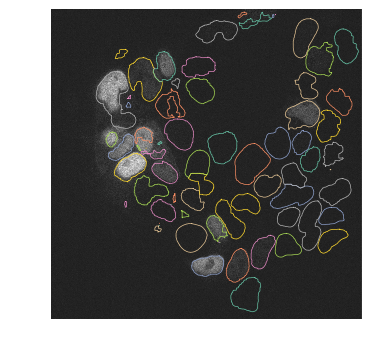

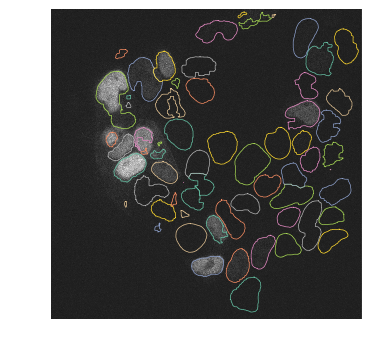

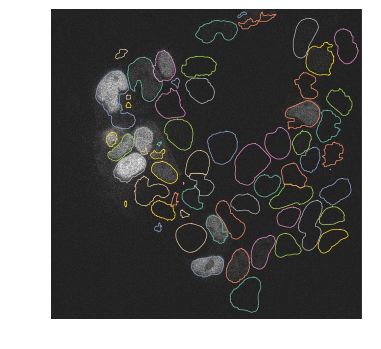

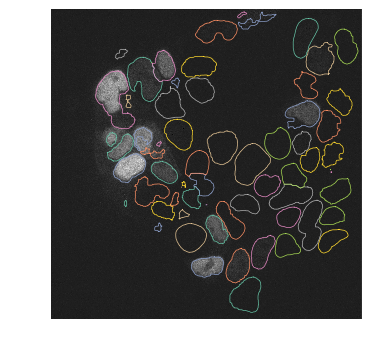

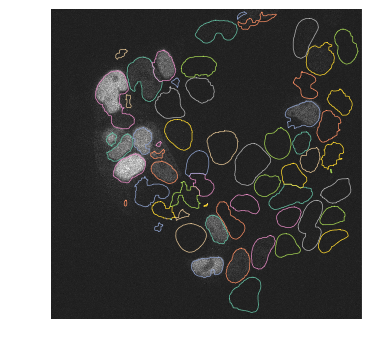

...

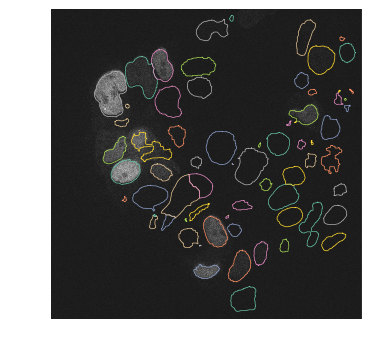

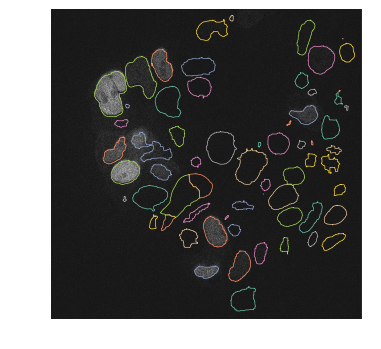

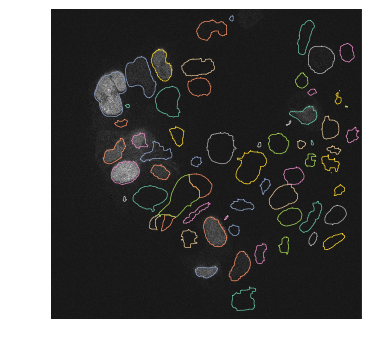

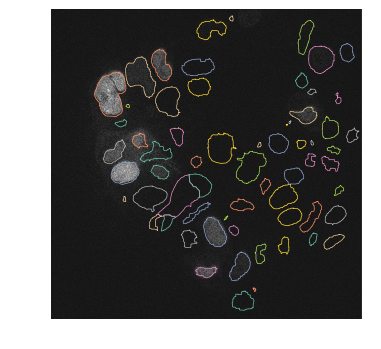

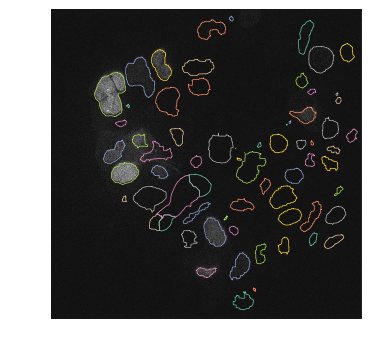

In [178]:
overlay_stack = overlayStack(GFP_stack, outline_stack)

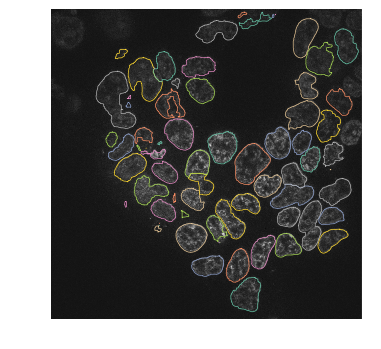

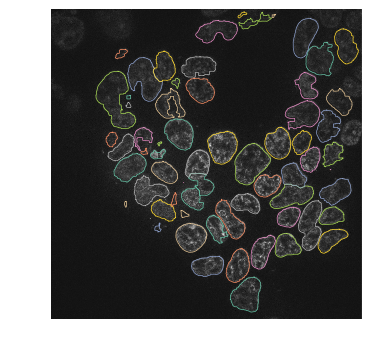

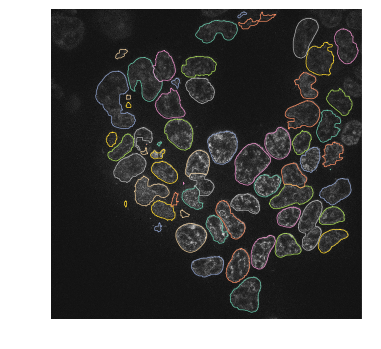

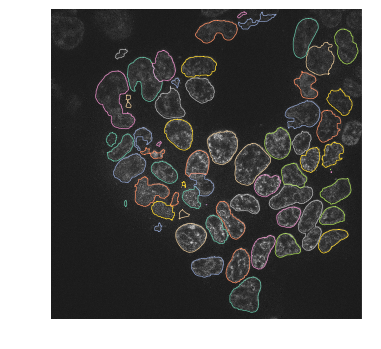

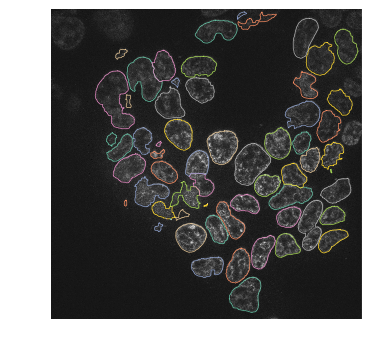

...

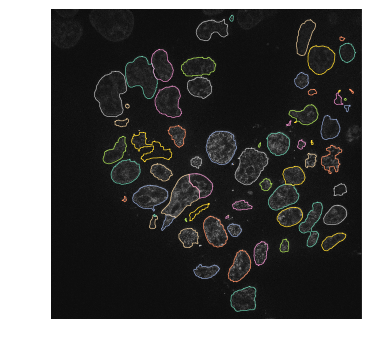

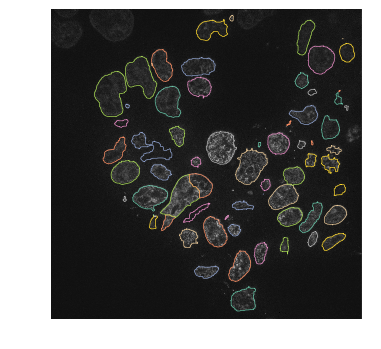

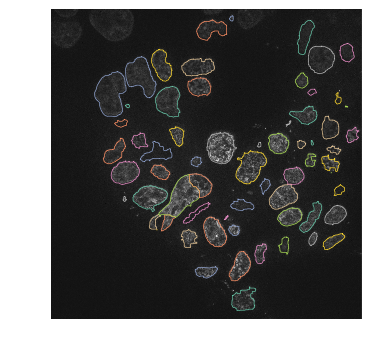

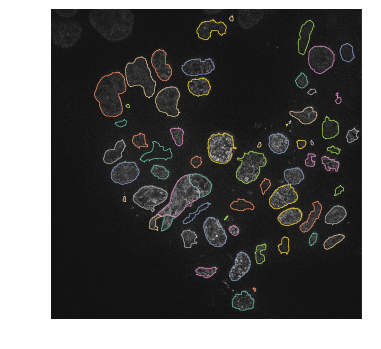

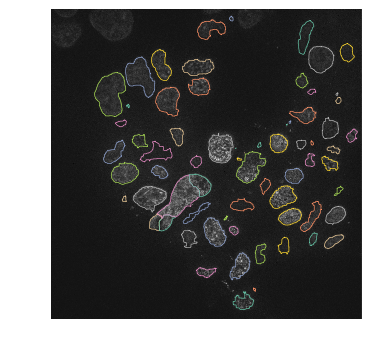

In [183]:
Hoechst_overlay_list = overlayStack(Hoechst_stack, outline_stack)

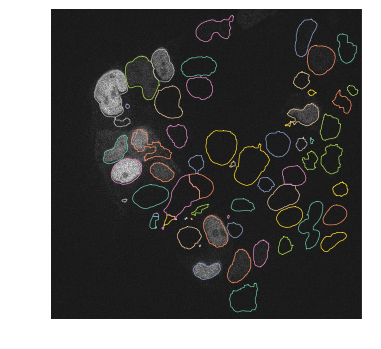

In [182]:
#Recall a overlay image for a z-slice of your choice
overlay_stack[16]

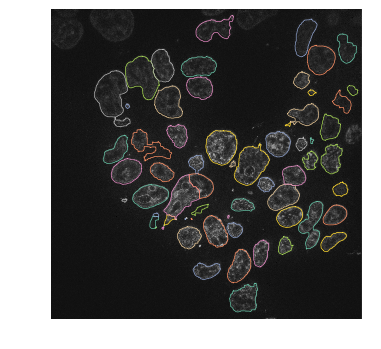

In [188]:
#Compare
Hoechst_overlay_list[16]

In [190]:
#Consider saving the axes instead of the figures.
ax

In [198]:
#Generate the overlay image stack
def overlayFig(intensity_stack, outline_stack, z):

    ##Overlay Contours
    fig, ax = plt.subplots()
#     ax.imshow(intensity_stack[z], interpolation='nearest', cmap=plt.cm.gray)
#     ax.axis('off')

    ax.set_color_cycle(sns.color_palette("Set2", len(outline_stack[z])))

    #Flatten a single z-slice
    flattened_list  = list(itertools.chain(*outline_stack[z]))

    #Plot contours
    for n, line in enumerate(flattened_list):
        ax.plot(line[:, 1], line[:, 0], linewidth=0.5)

        #Set limits based on instensity stack shape
        ax.set_xlim(0,len(intensity_stack[1]))
        ax.set_ylim(0,len(intensity_stack[2]))
    
    return ax

In [199]:
#operate on every z-slice and save as a list
def overlayStack(intensity_stack, outline_stack):

    overlay_ax_list=[]

    for z, frame in enumerate(intensity_stack):
        overlay_ax_list.append(overlayFig(intensity_stack, outline_stack, z))
        plt.clf #test

    return overlay_ax_list

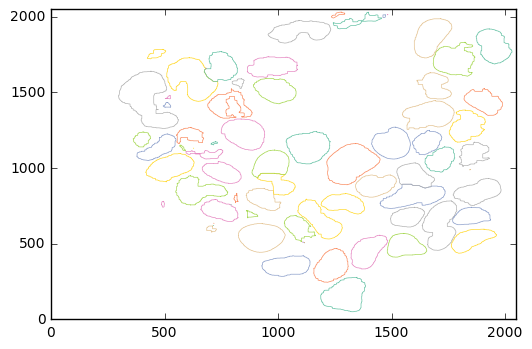

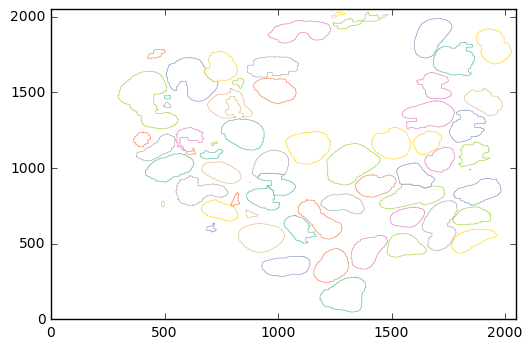

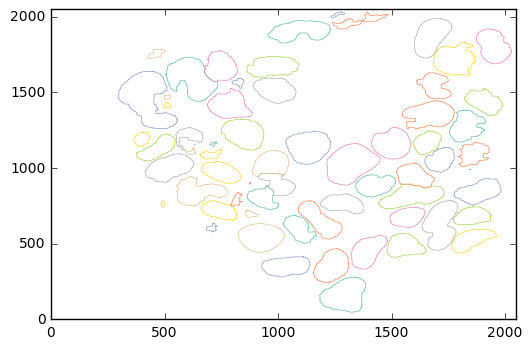

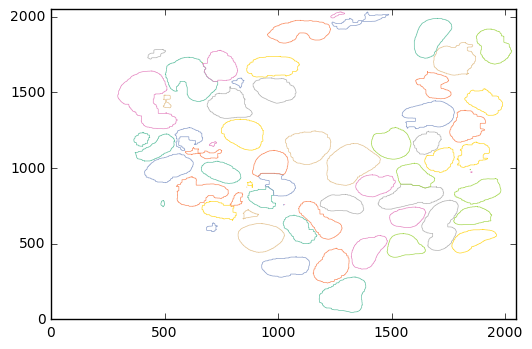

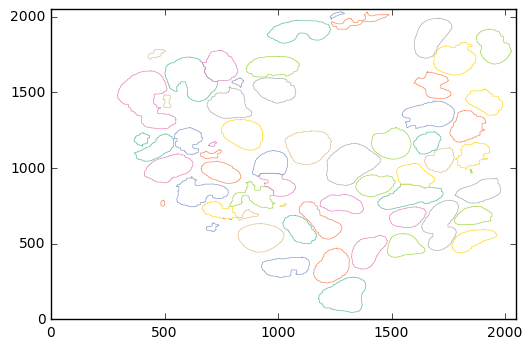

...

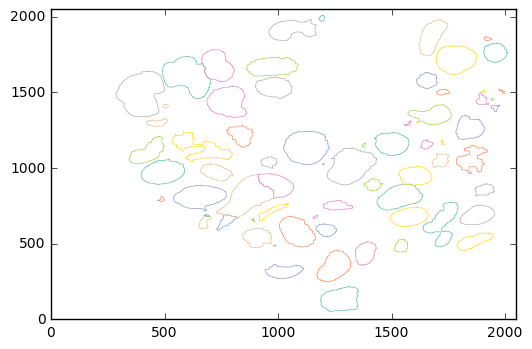

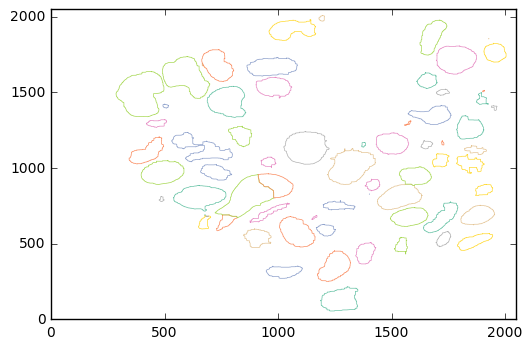

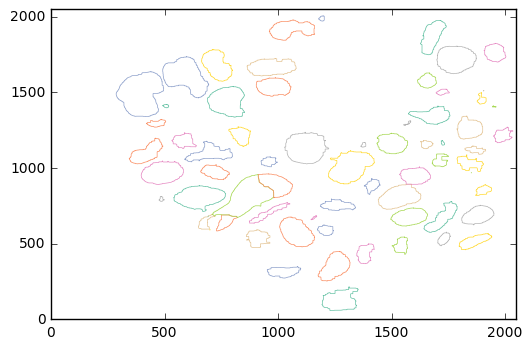

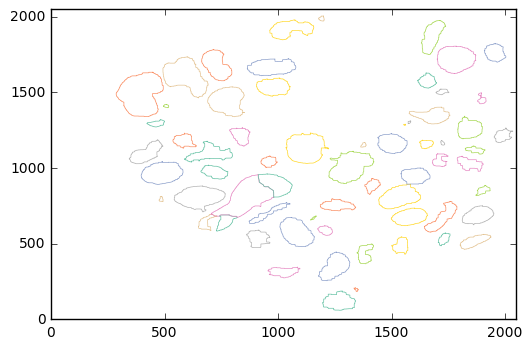

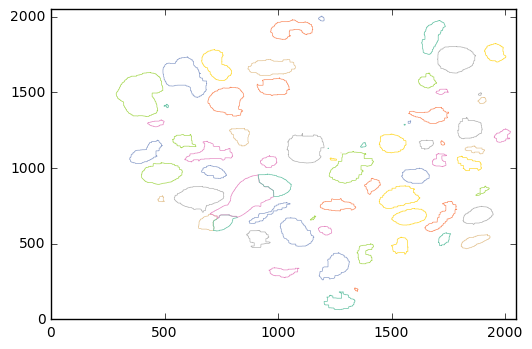

In [200]:
Hoechst_ax_list = overlayStack(Hoechst_stack, outline_stack)

In [201]:
Hoechst_ax_list[0]

TypeError: Image data can not convert to float

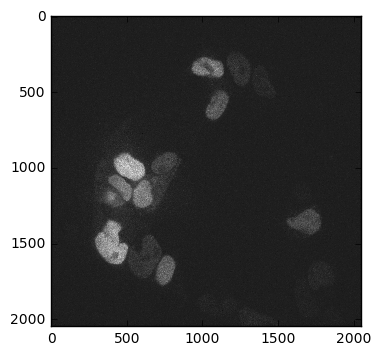

In [204]:
fig, ax = plt.subplots()
ax.imshow(GFP_stack[z], interpolation='nearest', cmap=plt.cm.gray)
plt.imshow(Hoechst_ax_list[z])

In [207]:
range(1,mask6.max()+1)
#mask6.max()

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48]

In [210]:
#Try saving the contours for each object in a list/ dataframe
#Operate on z-stack
def objOutlines(stack):
    
    outline_stack=[]
    
    #iterate through objects in mask
    for l in range(1,mask6.max()+1):
        
        outlines=[]
        
        #iterate through z-slices
        for z, frame in enumerate(stack):
            outlines.append([z, find_contours(frame==l, 0.8)])

        outline_stack.append([l, outlines])        
    
    return pd.DataFrame(outline_stack, columns=["Shell", "Contours"])

In [211]:
test = objOutlines(mask6)

In [212]:
test.head()

,Shell,Contours
0,1,"[[0, [[[ 278.2 1347. ]\n [ 278. 1346.8]\n..."
1,2,"[[0, [[[ 468.2 1256. ]\n [ 468.2 1255. ]\n..."
2,3,"[[0, [[[ 420.2 1111. ]\n [ 420.2 1110. ]\n..."
3,4,"[[0, [[[ 556.2 1448. ]\n [ 556.2 1447. ]\n..."
4,5,"[[0, [[[ 568.2 1554. ]\n [ 568.2 1553. ]\n..."
